<a href="https://colab.research.google.com/github/Eratofee/anwendungsbezogene_Programmierung/blob/main/7Scraping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 7. Scraping

## 1.1 Text aus Wikipedia

In [1]:
pip install wordcloud

In [2]:
pip install wikipedia

  Preparing metadata (setup.py) ... done
  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11679 sha256=17277ba8144d4a250b7864e5624922980987906733e24e58a9f1dbcaa959e8c9
  Stored in directory: /root/.cache/pip/wheels/8f/ab/cb/45ccc40522d3a1c41e1d2ad53b8f33a62f394011ec38cd71c6
Successfully built wikipedia


In [3]:
import wordcloud
import wikipedia
import matplotlib.pyplot as plt
import re
import numpy as np

In [4]:
# Wir suchen auf der englischen Wikipedia nach der Seite 'Web scraping'
wiki = wikipedia.page('Web scraping')
# und speichern den Inhalt in "text"
text = wiki.content

In [5]:
print(text)

Web scraping, web harvesting, or web data extraction is data scraping used for extracting data from websites. Web scraping software may directly access the World Wide Web using the Hypertext Transfer Protocol or a web browser. While web scraping can be done manually by a software user, the term typically refers to automated processes implemented using a bot or web crawler. It is a form of copying in which specific data is gathered and copied from the web, typically into a central local database or spreadsheet, for later retrieval or analysis.
Scraping a web page involves fetching it and then extracting data from it. Fetching is the downloading of a page (which a browser does when a user views a page). Therefore, web crawling is a main component of web scraping, to fetch pages for later processing. Having fetched, extraction can take place. The content of a page may be parsed, searched and reformatted, and its data copied into a spreadsheet or loaded into a database. Web scrapers typica

In [6]:
# Clean text
text = re.sub(r'==.*?==+', '', text)
# text = text.replace('\n', '')

In [7]:
print(text)

Web scraping, web harvesting, or web data extraction is data scraping used for extracting data from websites. Web scraping software may directly access the World Wide Web using the Hypertext Transfer Protocol or a web browser. While web scraping can be done manually by a software user, the term typically refers to automated processes implemented using a bot or web crawler. It is a form of copying in which specific data is gathered and copied from the web, typically into a central local database or spreadsheet, for later retrieval or analysis.
Scraping a web page involves fetching it and then extracting data from it. Fetching is the downloading of a page (which a browser does when a user views a page). Therefore, web crawling is a main component of web scraping, to fetch pages for later processing. Having fetched, extraction can take place. The content of a page may be parsed, searched and reformatted, and its data copied into a spreadsheet or loaded into a database. Web scrapers typica

## 1.2 Wordcloud

In [8]:
# geplottet die übergebene Wordcloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud)
    plt.axis("off");

In [9]:
from wordcloud import WordCloud, STOPWORDS

# Erstelle eine word cloud
wordcloud = WordCloud(width= 3000,
                      height = 2000,
                      #random_state=1,
                      background_color='salmon',
                      colormap='Pastel1',
                      collocations=False,
                      stopwords = STOPWORDS).generate(text)

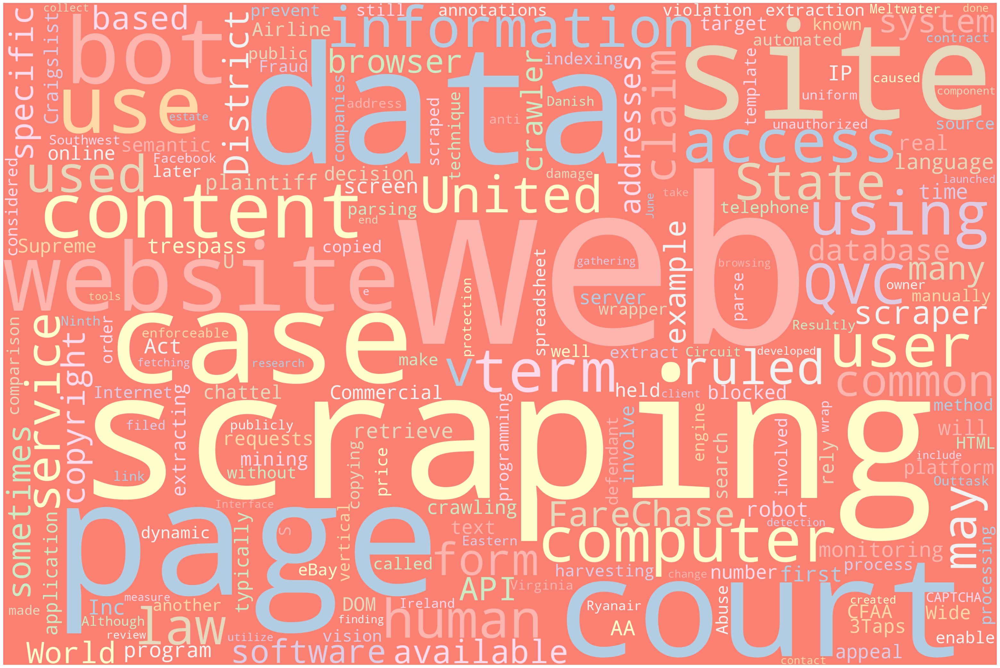

In [10]:
# und plotte sie
plot_cloud(wordcloud)

In [11]:
print(STOPWORDS)

{'hence', 'same', 'myself', 'himself', "it's", 'my', "you'd", 'who', "hadn't", 'otherwise', 'be', 'being', "he'd", 'out', 'a', 'up', "they're", 'his', "i'm", "you'll", 'its', 'any', "doesn't", 'but', "isn't", 'very', 'k', 'had', "they'd", 'are', 'all', "didn't", 'ever', 'or', 'then', "they've", "why's", 'her', 'down', 'under', 'you', 'on', 'was', 'yourself', "i'd", 'ourselves', "don't", 'shall', 'get', 'could', 'further', 'and', 'can', 'how', 'nor', 'since', "mustn't", 'from', 'below', 'she', 'again', 'by', 'r', 'it', 'these', "they'll", 'why', 'against', 'few', 'itself', 'herself', 'themselves', 'with', 'when', 'has', 'hers', 'doing', 'me', 'your', "where's", 'there', 'because', 'would', 'just', 'also', 'that', 'most', 'having', 'they', 'at', 'through', "wasn't", 'in', 'once', 'so', 'where', 'until', 'such', "how's", "who's", 'the', 'http', 'did', 'ours', 'www', 'of', 'however', 'between', 'what', 'more', "aren't", "haven't", 'before', 'him', 'each', 'some', 'our', 'this', "hasn't", "

Erstellt eine eigene Wordcloud zu einem Wikipedia-Artikel eurer Wahl und beliebigen Farbeinstellungen: https://matplotlib.org/stable/tutorials/colors/colormaps.html

In [12]:
wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      random_state=1,
                      background_color='black',
                      colormap='Set2',
                      collocations=False,
                      stopwords = STOPWORDS).generate(text)

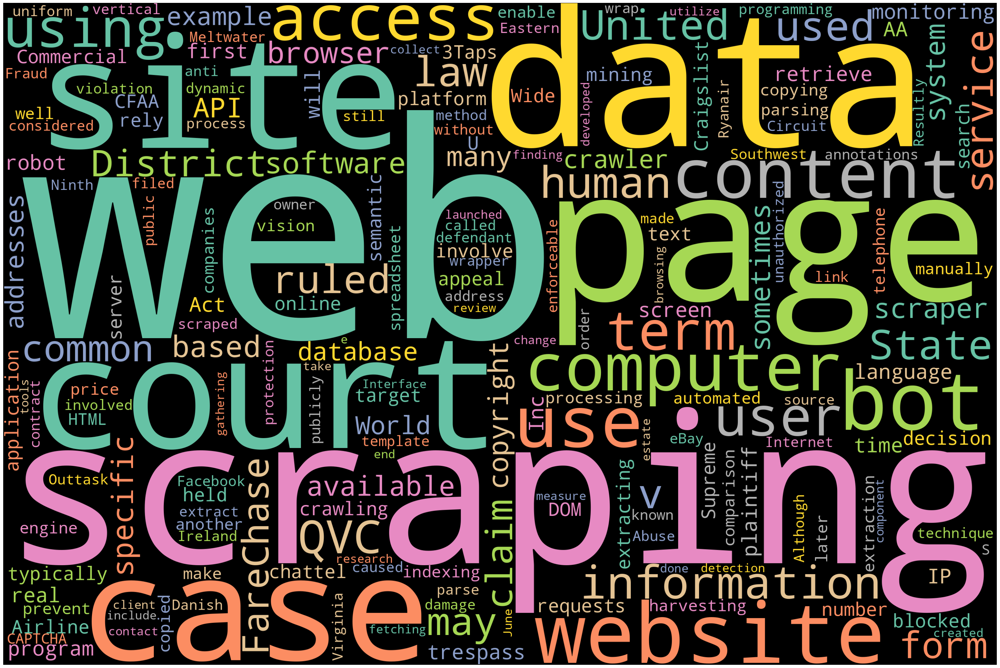

In [13]:
# Plot
plot_cloud(wordcloud)

Gefällt euch die akutelle Variante, dann speichert sie in einem Unterordner "WordCloud" auf dem Rechner.

In [14]:
# Save image
wordcloud.to_file("wordcloud.png")

# hier erstmal HALT !

## 1.3 Wordcloud mit Maske

## 1.3.1 Maske z.B. von hier: https://www.kaggle.com/datasets/aashita/masks?select=upvote.png

In [15]:
pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=d9abd7149d3e6964f95aed29dfc34b452c2e2fb19e115627a61c4c0c07c39394
  Stored in directory: /root/.cache/pip/wheels/40/b3/0f/a40dbd1c6861731779f62cc4babcb234387e11d697df70ee97
Successfully built wget


In [16]:
from PIL import Image

In [18]:
mask = np.array(Image.open("upvote.png"))

wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      random_state=1,
                      background_color='navy',
                      colormap='rainbow',
                      collocations=False,
                      stopwords = STOPWORDS,
                      mask=mask).generate(text)

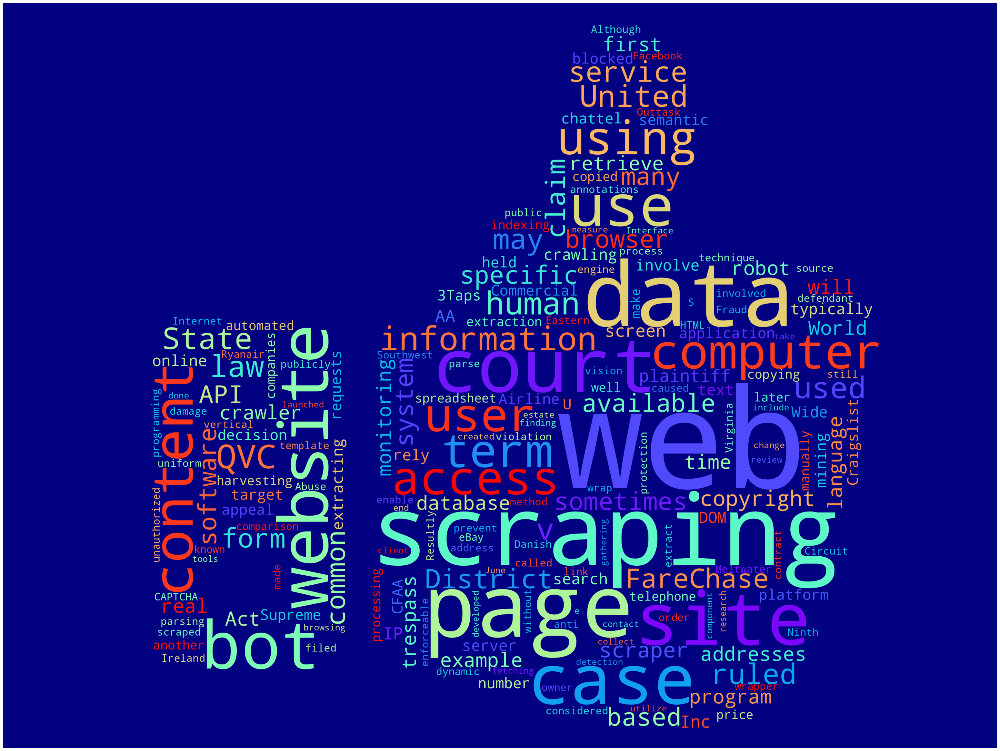

In [19]:
# Plot
plot_cloud(wordcloud)

## 1.3.2 oder Maske in Schwarz-Weiß selbst zeichnen

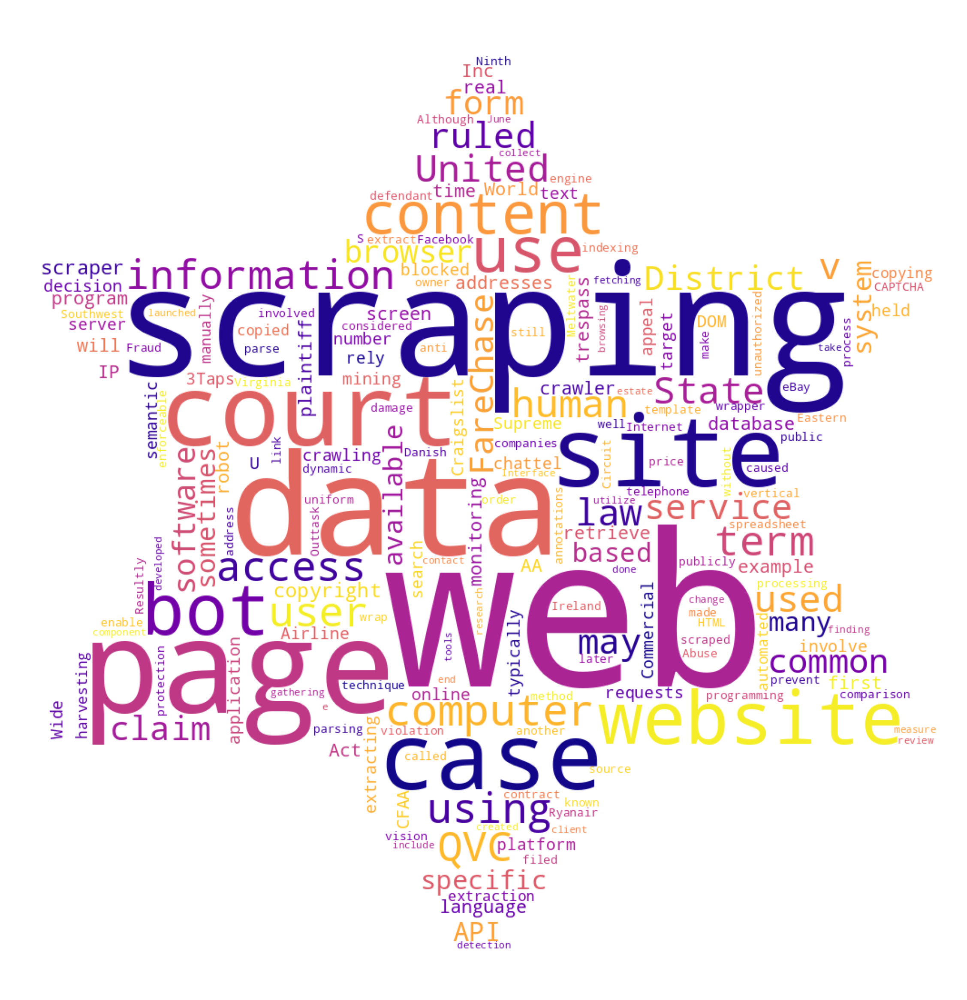

In [23]:
mask = np.array(Image.open('Star.png'))

wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      random_state=1,
                      background_color='white',
                      colormap='plasma',
                      collocations=False,
                      stopwords = STOPWORDS,
                      mask=mask).generate(text)# Plot
plot_cloud(wordcloud)

Echte Anwendung: mein Lieblingssport in der deutschen Wikipedia

In [24]:
with open('german_stopwords.txt', encoding='utf8') as file:
    german_stopwords = file.read().splitlines()

In [25]:
print(german_stopwords)

['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten', 'achter', 'achtes', 'ag', 'alle', 'allein', 'allem', 'allen', 'aller', 'allerdings', 'alles', 'allgemeinen', 'als', 'also', 'am', 'an', 'ander', 'andere', 'anderem', 'anderen', 'anderer', 'anderes', 'anderm', 'andern', 'anderr', 'anders', 'au', 'auch', 'auf', 'aus', 'ausser', 'ausserdem', 'außer', 'außerdem', 'b', 'bald', 'bei', 'beide', 'beiden', 'beim', 'beispiel', 'bekannt', 'bereits', 'besonders', 'besser', 'besten', 'bin', 'bis', 'bisher', 'bist', 'c', 'd', 'd.h', 'da', 'dabei', 'dadurch', 'dafür', 'dagegen', 'daher', 'dahin', 'dahinter', 'damals', 'damit', 'danach', 'daneben', 'dank', 'dann', 'daran', 'darauf', 'daraus', 'darf', 'darfst', 'darin', 'darum', 'darunter', 'darüber', 'das', 'dasein', 'daselbst', 'dass', 'dasselbe', 'davon', 'davor', 'dazu', 'dazwischen', 'daß', 'dein', 'deine', 'deinem', 'deinen', 'deiner', 'deines', 'dem', 'dementsprechend', 'demgegenüber', 'demgemäss', 'demgemäß', 'demselben', 'demzufolge', 'den'

In [26]:
# Wir stellen auf die deutsche Wikipedia-Welt um
wikipedia.set_lang("de")
wiki = wikipedia.page('Taekwondo')
text = wiki.content

# Wieder
text = re.sub(r'==.*?==+', '', text)
text = text.replace('\n', '')

text = text.replace('Taekwondo', 'Taekwon-Do')

# Import image to np.array
mask = np.array(Image.open('punch3Col.png'))

In [27]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      random_state=1,
                      # background_color='white',
                      # colormap='inferno',
                      background_color='black',
                      colormap='plasma',
                      collocations=True,
                      stopwords = german_stopwords,
                      mask=mask).generate(text)

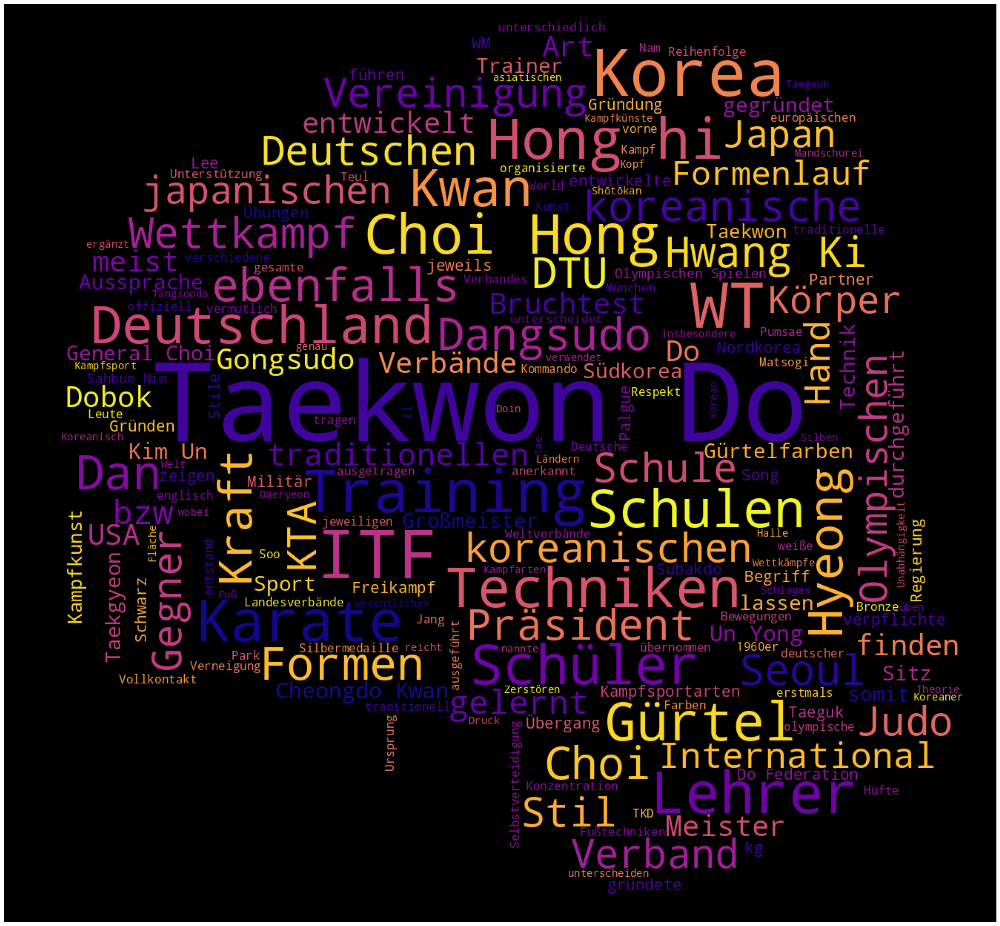

In [28]:
# Plot
plot_cloud(wordcloud)

In [29]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      random_state=1,
                      background_color='black',
                      colormap='GnBu',
                      collocations=True,
                      stopwords = german_stopwords,
                      mask=mask).generate(text)

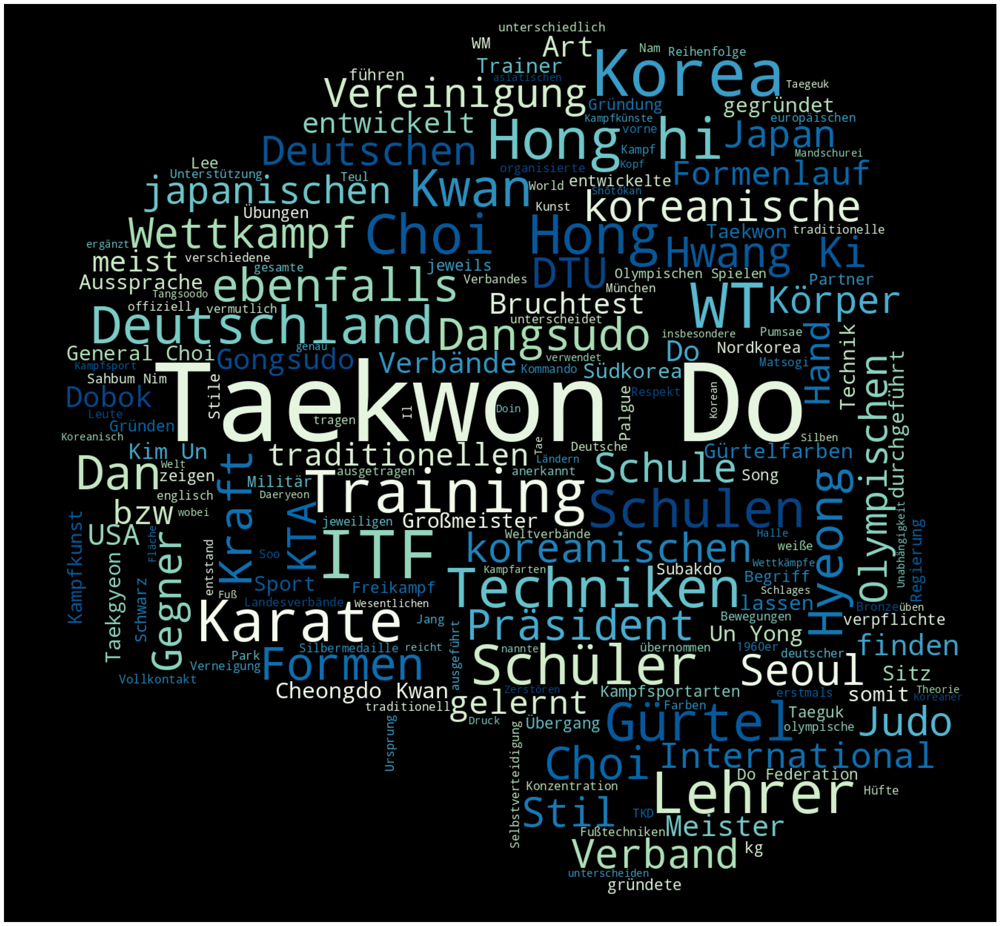

In [30]:
# Plot
plot_cloud(wordcloud)

## 2. Mediendateien

Wenn wir auch auf nicht Wikipedia scrapen wollten oder Mediendatein spezifieren möchten, brauchen wir eine mächtigere Kombination aus Modulen.

In [31]:
# Import packages
from urllib.request import urlopen
from bs4 import BeautifulSoup# Specify url of the web page

In [32]:
source = urlopen('https://de.wikipedia.org/wiki/Klarinette').read()# Make a soup
soup = BeautifulSoup(source,'lxml')

In [33]:
soup

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="de">
<head>
<meta charset="utf-8"/>
<title>Klarinette – Wikipedia</title>
<script>(function(){var className="client-js";var cookie=document.cookie.match(/(?:^|; )dewikimwclientpreferences=([^;]+)/);if(cookie){cookie[1].split('%2C').forEach(function(pref){className=className.replace(new RegExp('(^| )'+pref.replace(/-clientpref-\w+$|[^\w-]+/g,'')+'-clientpref-\\w+( |$)'),'$1'+pref+'$2');});}document.documentElement.className=className;}());RLCONF={"wgBreakFrames":false,"wgSeparatorTransformTable":[",\t.",".\t,"],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","Januar","Februar","März","April","Mai","Juni","Juli","August","September","Oktober","November","Dezember"],"wgRequestId":"dae80b29-3bd1-4d48-9c7e-ca6beeb07b1c","wgCanonicalNamespace":"","wgCanonicalSpecialPageName":false,"wgNamespaceNumber":0,"wgPageName":"Klarinette","wgTitle":"Klarinette","wgCurRevisionId":252479503,"wgRevisionId":252479503,"

In [35]:
print(set([text.parent.name for text in soup.find_all(text=True)]))

{'span', 'b', 'li', 'i', 'html', 'h3', 'footer', 'sub', 'td', 'tbody', 'a', 'sup', 'dl', 'th', 'script', 'ul', 'div', 'style', 'cite', 'title', 'table', 'h2', 'tr', 'figcaption', 'p', 'nav', 'dt', 'head', 'ol', 'body', 'dd', 'label', 'big', 'form', '[document]', 'small'}


<ipython-input-35-cd180c57435d>:1: DeprecationWarning: The 'text' argument to find()-type methods is deprecated. Use 'string' instead.
  print(set([text.parent.name for text in soup.find_all(text=True)]))


Um den reinen Text zu erholten suchen wir den "p" tag.

In [36]:
text = ''
for paragraph in soup.find_all('p'):
    text += paragraph.text

text

"Die Klarinette ist ein Holzblasinstrument mit teils zylindrischer und teils konischer Bohrung. Ihr Mundstück ist wie beim Saxophon mit einem einfachen Rohrblatt ausgestattet. Der Name des Instruments (von italienisch clarinetto[1]: „kleines Clarino“) wird darauf zurückgeführt, dass sie im hohen Register ähnlich klingt wie die hohe Clarin-Trompete, deren Funktion sie im 18. Jahrhundert teilweise übernahm. Sie verfügt über einen für Blasinstrumente sehr großen Tonumfang von ungefähr vier Oktaven. Es gibt nicht nur die Klarinette, sondern eine ganze Familie von unterschiedlich gestimmten Klarinetten, von der Kontrabasslage bis zum Sopranino. Hinsichtlich der Notation handelt es sich mit Ausnahme der seltenen C-Klarinette um transponierende Instrumente. Unter diesen hat die B-Klarinette in der Praxis die größte Bedeutung, gefolgt von der Klarinette in A. Diese beiden Instrumente klingen eine große Sekunde bzw. eine kleine Terz tiefer als in deren Notensatz notiert.\nModerne Klarinetten we

In [37]:
text = re.sub(r'\[.*?\]+', '', text)
text = text.replace('\n', '')

text

"Die Klarinette ist ein Holzblasinstrument mit teils zylindrischer und teils konischer Bohrung. Ihr Mundstück ist wie beim Saxophon mit einem einfachen Rohrblatt ausgestattet. Der Name des Instruments (von italienisch clarinetto: „kleines Clarino“) wird darauf zurückgeführt, dass sie im hohen Register ähnlich klingt wie die hohe Clarin-Trompete, deren Funktion sie im 18. Jahrhundert teilweise übernahm. Sie verfügt über einen für Blasinstrumente sehr großen Tonumfang von ungefähr vier Oktaven. Es gibt nicht nur die Klarinette, sondern eine ganze Familie von unterschiedlich gestimmten Klarinetten, von der Kontrabasslage bis zum Sopranino. Hinsichtlich der Notation handelt es sich mit Ausnahme der seltenen C-Klarinette um transponierende Instrumente. Unter diesen hat die B-Klarinette in der Praxis die größte Bedeutung, gefolgt von der Klarinette in A. Diese beiden Instrumente klingen eine große Sekunde bzw. eine kleine Terz tiefer als in deren Notensatz notiert.Moderne Klarinetten werden 

das entpricht dem einfacheren:

In [38]:
wikipedia.set_lang("de")
wiki = wikipedia.page('Klarinette')
text_wiki = wiki.content

# Wieder
text_wiki = re.sub(r'==.*?==+', '', text_wiki)
text_wiki = text_wiki.replace('\n', '')
# text_wiki

Aber wir suchen die .ogg Datei

In [39]:
parser = 'lxml'
resp = urlopen("https://en.wikipedia.org/wiki/Funk")
soup = BeautifulSoup(resp, parser)

media = soup.find_all('source')
media_links=[]
for medium in media:
    print()
    media_links.append("https:"+medium["src"])

In [40]:
print(media_links)

['https://upload.wikimedia.org/wikipedia/commons/b/b0/Funky_Slap_Bass_line.ogg', 'https://upload.wikimedia.org/wikipedia/commons/transcoded/b/b0/Funky_Slap_Bass_line.ogg/Funky_Slap_Bass_line.ogg.mp3']


Wenn wir den genauen Dateipfad haben, kann man mit wget die Datei automatisiert herunterladen.

Erst die einzelne Datei:

In [41]:
import wget
remote_url = 'https://upload.wikimedia.org/wikipedia/commons/0/07/Mozart_Quintett_Bassettklarinette_Larghetto.ogg'
local_file = 'clarinet.ogg'
download = wget.download(remote_url, local_file)

In [42]:
download

'clarinet.ogg'

In [43]:
print(download)

clarinet.ogg


Dann für die ganze (vielleicht auch) unbekannte Liste:

In [44]:
for link in media_links:
    local_file = link[-10:]
    wget.download(link, local_file)

## kleiner Exkurs: Börsenwerte

Hier als Beispiel aus: https://www.google.com/finance/quote/AB9:ETR

In [45]:
def getRecentStockPrice():
    url = "https://www.google.com/finance/quote/AB9:ETR"
    r = urlopen(url)
    soup = BeautifulSoup(r.read(), 'html.parser')

    for div in soup.find_all('div', attrs={'class': 'YMlKec fxKbKc'}):
        print(div.text)

getRecentStockPrice()

€39.30
